# Binary Classification of Machine Failures

<figure style="display: block; margin: 0 auto; text-align:center;">
<img src="https://images.unsplash.com/photo-1611117775350-ac3950990985?ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D&auto=format&fit=crop&w=1171&q=80" alt="Photo from David Vives in Unsplash" />
<figcaption>Photo from <a href="https://unsplash.com/@minkus">Minku Kang</a> in <a href="https://unsplash.com/photos/aCniNTiIFd8">Unsplash</a></figcaption></figure>

The dataset used in this project belongs to a kaggle competition [1]. Both train and test were generated from a deep learning model trained on the Machine Failure Predictions [2]. Therefore, the feature distributions are close to, but not exactly the same, as the original.

The dataset contains 3 files:
*   train.csv: Training dataset, the column labeled as **machine failure** is the (binary) target.
* test.csv: Test dataset, the objective is to predict the **probability** of machine failure.
* sample_submission.csv: A sample submission file in the required correct format.

In [ ]:
!pip install numpy matplotlib seaborn plotly --quiet

In [ ]:
!pip install jovian opendatasets xgboost lightgbm scikit-learn --quiet

## Problem Statement

This tutorial takes a practical and coding-focused approach. We'll learn gradient boosting by applying it to a real-world dataset from the [Rossmann Store Sales](https://www.kaggle.com/c/rossmann-store-sales) competition on Kaggle:

> Rossmann operates over 3,000 drug stores in 7 European countries. Currently, Rossmann store managers are tasked with predicting their daily sales for up to six weeks in advance. Store sales are influenced by many factors, including promotions, competition, school and state holidays, seasonality, and locality.
>
>
> With thousands of individual managers predicting sales based on their unique circumstances, the accuracy of results can be quite varied. You are provided with historical sales data for 1,115 Rossmann stores. The task is to forecast the "Sales" column for the test set. Note that some stores in the dataset were temporarily closed for refurbishment.
>
> View and download the data here: https://www.kaggle.com/c/rossmann-store-sales/data

## Downloading the dataset

In [ ]:
import os
import opendatasets as od
import numpy as np
import pandas as pd
pd.set_option("display.max_columns", 120)

In [ ]:
od.download('https://www.kaggle.com/competitions/playground-series-s3e17')

In [ ]:
os.listdir('playground-series-s3e17')

['train.csv', 'sample_submission.csv', 'test.csv']

In [ ]:
train_df = pd.read_csv('./playground-series-s3e17/train.csv', low_memory=False)
test_df = pd.read_csv('./playground-series-s3e17/test.csv')
submission_df = pd.read_csv('./playground-series-s3e17/sample_submission.csv')

In [ ]:
train_df.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,0,L50096,L,300.6,309.6,1596,36.1,140,0,0,0,0,0,0
1,1,M20343,M,302.6,312.1,1759,29.1,200,0,0,0,0,0,0
2,2,L49454,L,299.3,308.5,1805,26.5,25,0,0,0,0,0,0
3,3,L53355,L,301.0,310.9,1524,44.3,197,0,0,0,0,0,0
4,4,M24050,M,298.0,309.0,1641,35.4,34,0,0,0,0,0,0


In [ ]:
test_df.head()

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0
3,136432,M21232,M,300.1,309.6,1479,47.6,5,0,0,0,0,0
4,136433,M19751,M,303.4,312.3,1515,41.3,114,0,0,0,0,0


In [ ]:
submission_df.head()

,id,Machine failure
0,136429,0.5
1,136430,0.5
2,136431,0.5
3,136432,0.5
4,136433,0.5


It seems that our submission dataset will need to columns: the identifier of the machine `id` and the probability of failure `machine failure`.

## Exploratory Data Analysis

In [ ]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (8,5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [ ]:
import plotly.express as px

Let's start by checking the dimensions of our training data.

In [ ]:
train_df.shape

(136429, 14)

Our data has 13 features (not including the `id`). Also, it has 136,429 observations.

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136429 entries, 0 to 136428
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       136429 non-null  int64  
 1   Product ID               136429 non-null  object 
 2   Type                     136429 non-null  object 
 3   Air temperature [K]      136429 non-null  float64
 4   Process temperature [K]  136429 non-null  float64
 5   Rotational speed [rpm]   136429 non-null  int64  
 6   Torque [Nm]              136429 non-null  float64
 7   Tool wear [min]          136429 non-null  int64  
 8   Machine failure          136429 non-null  int64  
 9   TWF                      136429 non-null  int64  
 10  HDF                      136429 non-null  int64  
 11  PWF                      136429 non-null  int64  
 12  OSF                      136429 non-null  int64  
 13  RNF                      136429 non-null  int64  
dtypes: f

It looks like we have 12 numeric and 2 categorical columns and, affortunately, no missing values are found in our dataset.

In [ ]:
train_df.nunique()

id                         136429
Product ID                   9976
Type                            3
Air temperature [K]            95
Process temperature [K]        81
Rotational speed [rpm]        952
Torque [Nm]                   611
Tool wear [min]               246
Machine failure                 2
TWF                             2
HDF                             2
PWF                             2
OSF                             2
RNF                             2
dtype: int64

It seems that the dataset contains 9976 different machines (Product ID) that are classified in 3 types.

In [ ]:
train_df.describe(include=[object])

,Product ID,Type
count,136429,136429
unique,9976,3
top,L53257,L
freq,139,95354


In [ ]:
train_df.drop(columns='id').describe(include=[np.number])

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
count,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000,136429.000000
mean,299.862776,309.941070,1520.331110,40.348643,104.408901,0.015744,0.001554,0.005160,0.002397,0.003958,0.002258
std,1.862247,1.385173,138.736632,8.502229,63.965040,0.124486,0.039389,0.071649,0.048899,0.062789,0.047461
min,295.300000,305.800000,1181.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,298.300000,308.700000,1432.000000,34.600000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,300.000000,310.000000,1493.000000,40.400000,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,301.200000,310.900000,1580.000000,46.100000,159.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,304.400000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Only the CRIM, AGE, and Bk seems to be skewed as the median (50% percentile) and the min value differs significantly.

### Machine failure
First, Let's explore our target feature. We know that it is binary (0 non-failure, 1 failure). For now, we'll use the `id`as the index.

In [ ]:
train_df.set_index(keys='id', inplace=True)

In [ ]:
train_df['Machine failure'].value_counts() / train_df['Machine failure'].count() * 100

0    98.425555
1     1.574445
Name: Machine failure, dtype: float64

It seems that our data is highly imbalanced 98.425% of our data is a non-failure.

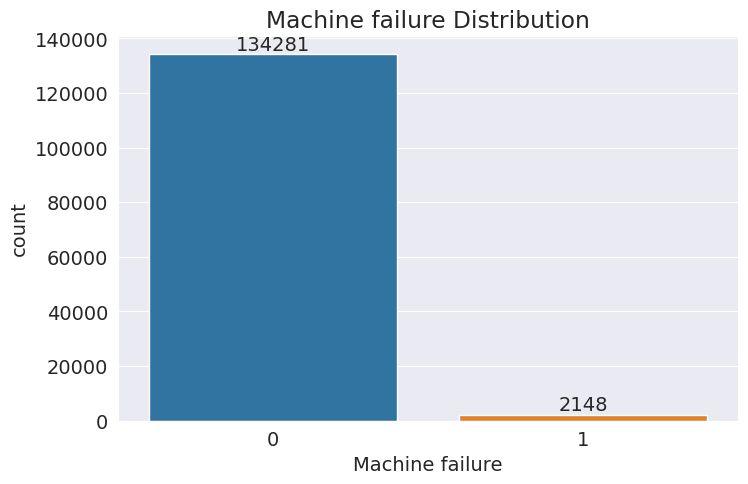

In [ ]:
ax = sns.countplot(data=train_df, x='Machine failure');
ax.set(title='Machine failure Distribution');
ax.bar_label(ax.containers[0]);

The chart shows the quantitative imbalance.

#### Correlations

In [ ]:
corr_matrix = train_df.select_dtypes(include=np.number).corr()
corr_matrix

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
Air temperature [K],1.000000,0.856080,0.016545,-0.006773,0.016994,0.067744,0.003826,0.100454,0.007967,0.007842,0.004815
Process temperature [K],0.856080,1.000000,0.011263,-0.006298,0.012777,0.030966,0.004459,0.041454,0.003871,0.005337,0.004399
Rotational speed [rpm],0.016545,0.011263,1.000000,-0.779394,0.003983,-0.060868,-0.005765,-0.081996,0.053948,-0.061376,-0.003410
Torque [Nm],-0.006773,-0.006298,-0.779394,1.000000,-0.003148,0.145793,0.012983,0.100773,0.050289,0.108765,0.007986
Tool wear [min],0.016994,0.012777,0.003983,-0.003148,1.000000,0.056448,0.046470,0.011709,0.007624,0.063604,-0.002071
Machine failure,0.067744,0.030966,-0.060868,0.145793,0.056448,1.000000,0.311919,0.564507,0.383941,0.494668,0.001428
TWF,0.003826,0.004459,-0.005765,0.012983,0.046470,0.311919,1.000000,0.010145,0.039927,0.036041,0.002044
HDF,0.100454,0.041454,-0.081996,0.100773,0.011709,0.564507,0.010145,1.000000,0.046680,0.067149,0.000885
PWF,0.007967,0.003871,0.053948,0.050289,0.007624,0.383941,0.039927,0.046680,1.000000,0.090016,0.000827
OSF,0.007842,0.005337,-0.061376,0.108765,0.063604,0.494668,0.036041,0.067149,0.090016,1.000000,-0.000539


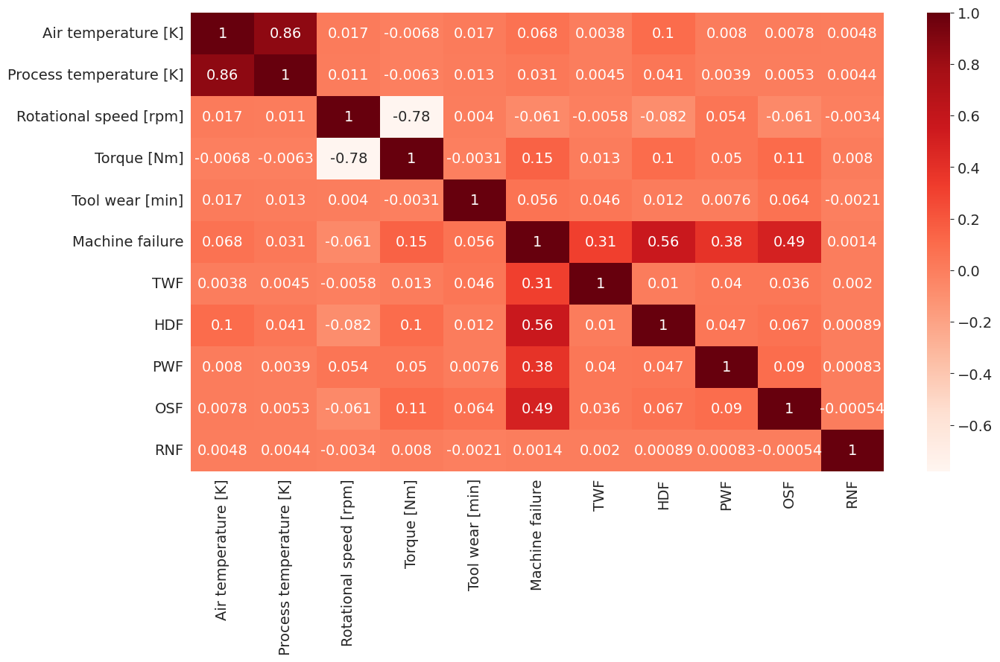

In [ ]:
plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, cmap='Reds', annot=True);

### Product ID

Taking a look to a column that is apparently, and by all means, and ID seems to be redundant, but one never knows what insights it can gather from it.

In [ ]:
product_count_df = train_df['Product ID'].value_counts().reset_index(name='counts')
product_count_df

,index,counts
0,L53257,139
1,L49056,131
2,L53271,131
3,L54275,120
4,L48892,120
...,...,...
9971,M24614,1
9972,H39399,1
9973,M15853,1
9974,H32637,1


In [ ]:
fig = px.histogram(product_count_df, x="counts",
                   marginal="box", title="Number of Observations by Product ID")
fig.show()

Let's write a function to calculate the skewness and kurtosis givien a `pandas` `pd.Series`.

In [ ]:
def get_skew_kurt(data: pd.Series) -> tuple[float, float]:
    """
    Given a pandas' series, calculates the skewness and kurtosis of the distribution
    using parametric methods.

    Args:
        data: A pandas series representing a distribution of data.

    Returns:
        tuple: The data's distribution skewness and kurtosis respectively.
    """
    skew = data.skew()
    kurt = data.kurtosis()
    print(f"The skewness of the distribution is {skew:.2f} and the kurtosis is {kurt:.2f}.")
    return skew, kurt

In [ ]:
skew, kurt = get_skew_kurt(product_count_df['counts'])

The skewness of the distribution is 3.29 and the kurtosis is 18.09.


It seems that the distribution of observations for each machine (Product ID) is highly right skewed. Notice, there are several outlier as some machines have a high number of observations, being 139 the highest number of observations corresponding to the machine L53257. The median of observation done by machine is 11.

In [ ]:
product_failure_count_df = train_df.groupby(by=['Product ID', 'Machine failure']).size().reset_index(name='counts').sort_values(by='Product ID')
product_failure_count_df

,Product ID,Machine failure,counts
0,H29424,0,1
1,H29425,0,4
2,H29432,0,3
3,H29434,0,1
4,H29441,0,5
...,...,...,...
11282,M24849,0,5
11283,M24851,0,7
11284,M24855,0,2
11285,M24857,0,4


In [ ]:
fig = px.histogram(product_failure_count_df, x="counts",
                   marginal="box", color="Machine failure",
                   hover_data=["Product ID"],
                   title="Number of Observations by Product ID")
fig.show()

In [ ]:
train_df['Product ID'].drop_duplicates().sort_values()

id
1575     H29424
30448    H29425
5324     H29432
97122    H29434
5300     H29441
          ...  
9411     M24849
27794    M24851
29881    M24855
37007    M24857
43615    M24859
Name: Product ID, Length: 9976, dtype: object

In [ ]:
train_df.groupby(by=['Product ID', 'Machine failure']).size().reset_index(name='counts').sort_values(by='counts', ascending=False)

,Product ID,Machine failure,counts
5379,L53257,0,135
2322,L49056,0,131
5393,L53271,0,125
2218,L48892,0,120
6070,L54275,0,118
...,...,...,...
6608,L55086,1,1
6595,L55068,0,1
6592,L55064,1,1
6587,L55055,0,1


### Type

In [ ]:
type_count_df = train_df['Type'].value_counts().reset_index(name='counts')
type_count_df

,index,counts
0,L,95354
1,M,32152
2,H,8923


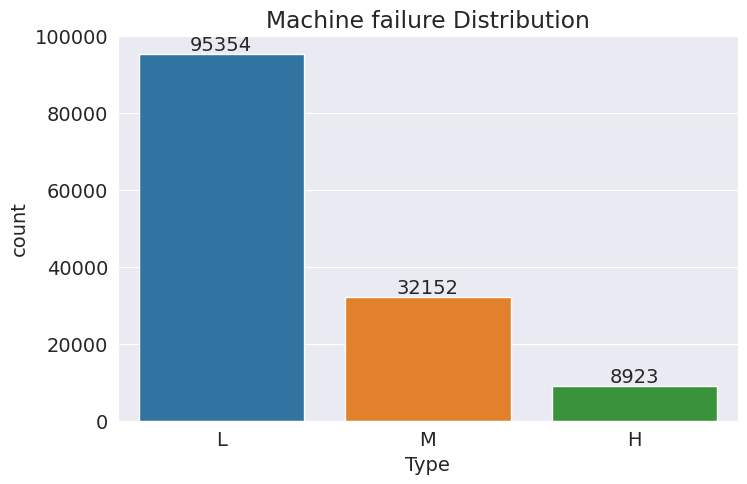

In [ ]:
ax = sns.countplot(data=train_df, x='Type');
ax.set(title='Machine failure Distribution');
ax.bar_label(ax.containers[0]);

In [ ]:
type_gpb = train_df.groupby(by=['Type', 'Machine failure']).size().reset_index(name='counts').sort_values(by='counts', ascending=False)
type_gpb

,Type,Machine failure,counts
2,L,0,93759
4,M,0,31715
0,H,0,8807
3,L,1,1595
5,M,1,437
1,H,1,116


In [ ]:
fig = px.histogram(train_df, x='Type', color="Machine failure",
                   title="Number of Observations by Product ID")
fig.show()

### Air temperature [K]

In [ ]:
result = get_skew_kurt(train_df["Air temperature [K]"])

The skewness of the distribution is 0.16 and the kurtosis is -0.78.


Accoring to the kurtosis and skewness, the distribution does not seems to be skewed; at the same time, the distribution appers to be mesokurtic (the value of kurtosis nears zero).

In [ ]:
fig = px.histogram(train_df, x="Air temperature [K]", nbins=100,
                   marginal="box", color="Machine failure",
                   title="Air Temperature by failure type")
fig.show()

It seems that the distribution will follow a normal distribution if more observations are added. A

### Process temperature [K]

In [ ]:
result = get_skew_kurt(train_df["Process temperature [K]"])

The skewness of the distribution is 0.06 and the kurtosis is -0.60.


Like `Aire Temperature`, the distribution does not seems to be skewed; at the same time, the distribution appers to be mesokurtic (the value of kurtosis nears zero) most likely because both features measure the same physical magnitude (temperature).

In [ ]:
fig = px.histogram(train_df, x="Process temperature [K]", nbins=100,
                   marginal="box", color="Machine failure",
                   title="Process Temperature by failure type")
fig.show()

In [ ]:
fig = px.scatter(train_df, x="Process temperature [K]", y="Air temperature [K]",
                 color=train_df['Machine failure'].astype(str),
                 title="Correlation Between Process and Air Temperature [K]")
fig.show()

The tempuratues are highly correlages, again, it seems to be due to both feature measuring up the same physical magnitud (at least for this dataset). Unfortunately, there seems to be no way to clearly distinguish a failure from a no failure based on themperature as both are present through all the distribution.

### Rotational speed [rpm]

In [ ]:
result = get_skew_kurt(train_df["Rotational speed [rpm]"])

The skewness of the distribution is 1.89 and the kurtosis is 8.18.


The distribution for `Rotational speed [rpm]` seems to be slightly skewed and at the same time, the distribution appears to be leptokurtic (positive kurtosis).

In [ ]:
fig = px.histogram(train_df, x="Rotational speed [rpm]",
                   marginal="box", color="Machine failure",
                   title="Rotational speed by failure type")
fig.show()

### Torque [Nm]

In [ ]:
result = get_skew_kurt(train_df["Torque [Nm]"])

The skewness of the distribution is -0.03 and the kurtosis is 0.13.


Out of all the features, the distribution for `Torque [Nm]` is the one that apperas to be the most *gaussian (normal)*.

In [ ]:
fig = px.histogram(train_df, x="Torque [Nm]",
                   marginal="box", color="Machine failure",
                   title="Torque by failure type")
fig.show()

In [ ]:
fig = px.scatter(train_df, x="Rotational speed [rpm]", y="Torque [Nm]",
                 color=train_df['Machine failure'].astype(str),
                 marginal_x="box", marginal_y="box",
                 title="Correlation Between Rotational speed [rpm] and Torque [Nm]")
fig.show()

Visually, there seems to be a big cluster of machine failures when the **rotational speed is low** and the **torque is high**.

### Tool wear [min]

In [ ]:
result = get_skew_kurt(train_df["Torque [Nm]"])

The skewness of the distribution is -0.03 and the kurtosis is 0.13.


In [ ]:
fig = px.histogram(train_df, x="Tool wear [min]",
                   marginal="box", color="Machine failure",
                   title="Number of Observations by Product ID")
fig.show()

Although, the distribution for `Tool wear [min]` is not skewed it does not appears to be normal.

### TWF, HDF, PWF, OSF and RNF
There is a high correlation between `Machine failure` and `TWF`, `HDF`, `PWF`, `OSF` and `RNF` as they seem to represent different types of failures.

In [ ]:
df_grouped = train_df.iloc[:, 7:].groupby('Machine failure').aggregate(['count', np.sum])
df_grouped.columns = ['_'.join(col) for col in df_grouped.columns.values]
df_grouped

,TWF_count,TWF_sum,HDF_count,HDF_sum,PWF_count,PWF_sum,OSF_count,OSF_sum,RNF_count,RNF_sum
Machine failure,,,,,,,,,,
0,134281,0,134281,6,134281,3,134281,4,134281,302
1,2148,212,2148,698,2148,324,2148,536,2148,6


There seem to be some errors in `HDF`, `PWF`, `OSF` and `RNF` as some observations, where there is not a machine failure, seems to been set to $1$. For example, *HDF_sum* seems to have 6 instances were no failure was present but for some reason `HDF` was set as $1$ (meaning that there was a failure). We'll need to set those values to 0. Likewise, for `PWF`, `OSF` and `RNF` with $3$, $4$, $302$. The error in last one, `RNF`, appears to be a swap of values meaning that $0$ is counted as a failure and $1$ as not failure. We'll take a look at the aforementioned in the model improment section.

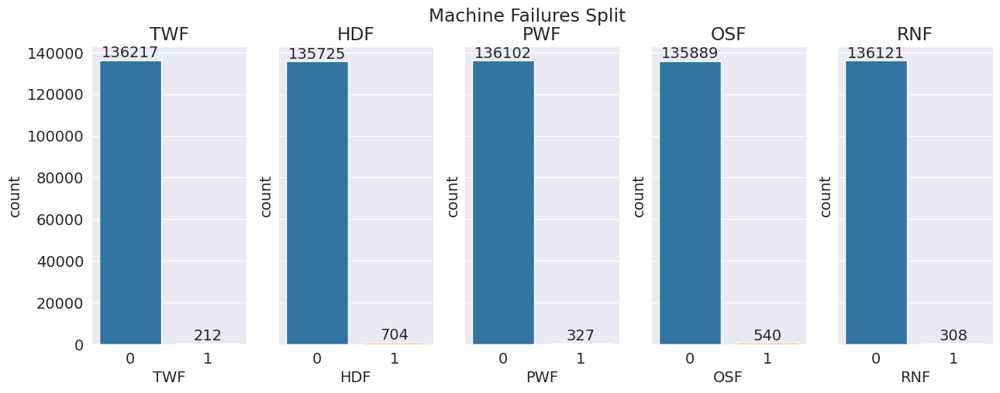

In [ ]:
fig, axes = plt.subplots(1, 5, sharey=True, figsize=(15, 5))
fig.suptitle('Machine Failures Split')
ax0 = sns.countplot(ax=axes[0], data=train_df, x='TWF');
ax1 = sns.countplot(ax=axes[1], data=train_df, x='HDF');
ax2 = sns.countplot(ax=axes[2], data=train_df, x='PWF');
ax3 = sns.countplot(ax=axes[3], data=train_df, x='OSF');
ax4 = sns.countplot(ax=axes[4], data=train_df, x='RNF');
ax0.set(title='TWF');
ax1.set(title='HDF');
ax2.set(title='PWF');
ax3.set(title='OSF');
ax4.set(title='RNF');
ax0.bar_label(ax0.containers[0]);
ax1.bar_label(ax1.containers[0]);
ax2.bar_label(ax2.containers[0]);
ax3.bar_label(ax3.containers[0]);
ax4.bar_label(ax4.containers[0]);

## Preparing the Data for Training

We'll perform the following steps to prepare the dataset for training:

1. Identify input and target columns
2. Identify numeric and categorical columns
3. Create baseline models to compare our trained models' performance.
4. Scale numeric values to the $(0, 1)$ range
5. Encode categorical columns to one-hot vectors

### Identifying Input and Target Columns

In our dataset, we can ignore the `id` and `Product ID` columns, at least until they prove to be useful in futher iteration of our methodology.

Let's create a  initial list of input columns, and also identify the target column.

In [ ]:
input_cols = train_df.columns.to_list()
input_cols.remove('Product ID')
input_cols.remove('Machine failure')
target_col = 'Machine failure'

In [ ]:
print(input_cols)

['Type', 'Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']


In [ ]:
numeric_cols = train_df[input_cols].select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_df[input_cols].select_dtypes('object').columns.tolist()
print(numeric_cols)
print(categorical_cols)

['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'TWF', 'HDF', 'PWF', 'OSF', 'RNF']
['Type']


### Splitting dataset into validation and traning sets.

In [ ]:
from sklearn.model_selection import train_test_split

X = train_df[input_cols]
y = train_df[target_col]
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)

Training set shape: (109143, 11) (109143,)
Validation set shape: (27286, 11) (27286,)


### Baseline Models

In [ ]:
from sklearn.dummy import DummyClassifier

baseline_mode = DummyClassifier(strategy='most_frequent', random_state=42)
baseline_mode.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [ ]:
baseline_random = DummyClassifier(strategy='stratified', random_state=42)
baseline_random.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='stratified')

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix

baselineMode_y_pred = baseline_mode.predict(X_val)
baselineRandom_y_pred = baseline_random.predict(X_val)

print('Most frequent model Accuracy:', accuracy_score(y_val, baselineMode_y_pred))
print('Random model Accuracy:', accuracy_score(y_val, baselineRandom_y_pred))
cf = confusion_matrix(y_val, baselineRandom_y_pred, normalize='true')

Most frequent model Accuracy: 0.9839478120647951
Random model Accuracy: 0.9687751960712453


Our baseline random model achieves an accuracy of $96.87$% and our baseline most frequent model achieves an accuracy of $98.39$%.

One can think that having such good scores we won't need to traing a ML model, but to a large extent this, high accuracy score, is due to an imbalance in our data.

It is hard to define if a classifier is good by only considering its accuracy score. Affortunately, `sklearn` offers a lot of metrics which we can use, e. g., the **confusion matrix**. By asking to Jobot [4]:


> A confusion matrix is a table that is often used to evaluate the performance of a classification model. It summarizes the actual and predicted classifications made by a model on a dataset. The matrix consists of four quadrants: true positives (TP), true negatives (TN), false positives (FP), and false negatives (FN).
Each element in the matrix represents the number of times a certain classification was made. Overall, the confusion matrix provides a clear and concise way to evaluate the performance of a classification model and diagnose any issues it may have.






So, let us introduce a helper function that will calculate and show a heatmap representation of the confusion matrix.

In [ ]:
def predict_and_plot(model, inputs: pd.DataFrame, target: pd.Series, model_name : str = '') -> tuple[np.ndarray, np.ndarray]:
    """
    Calculates the average of a list of numbers.
    Args:
        model: A ML model.
        inputs : A DataFrame representing the input values of the model.
        inputs : A Series representing the target values for the model.
        model_name : A String for the name of the model.

    Returns:
        tuple: The model predictions and the confusion matrix respectively.
    """
    y_pred = model.predict(inputs)

    accuracy = accuracy_score(target, y_pred) * 100
    print(f"Accuracy: {accuracy:.5f}%")

    cf = confusion_matrix(target, y_pred, normalize='true')
    plt.figure(figsize=(3,2))
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title(f'{model_name}\n Confusion Matrix');

    return y_pred, cf

Accuracy: 98.39478%


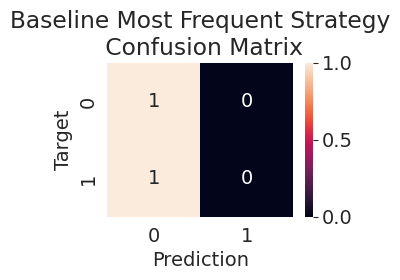

In [ ]:
val_preds, val_cf = predict_and_plot(baseline_mode, X_val, y_val, 'Baseline Most Frequent Strategy')

Accuracy: 96.87752%


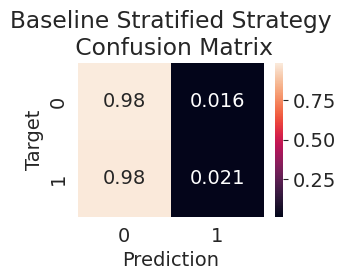

In [ ]:
val_preds, val_cf = predict_and_plot(baseline_random, X_val, y_val, 'Baseline Stratified Strategy')

Let's try to improve our predicting by training a model which actually *learns* the feeded data. We are going to use two types of models: `s` and `s`.

### Scaling Numeric Features

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler().fit(train_df[numeric_cols])

In [ ]:
X_val[numeric_cols].describe().loc[['min', 'max']]

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
min,295.4,305.8,1183.0,3.8,0.0,0.0,0.0,0.0,0.0,0.0
max,304.4,313.8,2874.0,76.6,253.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
X_train[numeric_cols] = scaler.transform(X_train[numeric_cols])
X_val[numeric_cols] = scaler.transform(X_val[numeric_cols])

In [ ]:
X_val[numeric_cols].describe().loc[['min', 'max']]

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
min,0.010989,0.0,0.001173,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.000000,1.0,0.992962,1.0,1.0,1.0,1.0,1.0,1.0,1.0


### Encoding Categorical Data

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore').fit(train_df[categorical_cols])

In [ ]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
encoded_cols

['Type_H', 'Type_L', 'Type_M']

In [ ]:
X_train[encoded_cols] = encoder.transform(X_train[categorical_cols])
X_val[encoded_cols] = encoder.transform(X_val[categorical_cols])

In [ ]:
X_val.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Type_H,Type_L,Type_M
id,,,,,,,,,,,,,,
123128,L,0.615385,0.6125,0.109677,0.799451,0.047431,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
54705,L,0.571429,0.6875,0.212317,0.442308,0.750988,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
40016,L,0.582418,0.5750,0.186510,0.476648,0.450593,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
75025,L,0.252747,0.3250,0.188270,0.476648,0.513834,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
120421,L,0.604396,0.6125,0.209971,0.476648,0.802372,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Let's select the columns that we are not going to use to traing our models.

In [ ]:
X_train = X_train[numeric_cols + encoded_cols]
X_val = X_val[numeric_cols + encoded_cols]

In [ ]:
X_val.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF,Type_H,Type_L,Type_M
id,,,,,,,,,,,,,
123128,0.615385,0.6125,0.109677,0.799451,0.047431,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
54705,0.571429,0.6875,0.212317,0.442308,0.750988,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
40016,0.582418,0.5750,0.186510,0.476648,0.450593,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
75025,0.252747,0.3250,0.188270,0.476648,0.513834,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
120421,0.604396,0.6125,0.209971,0.476648,0.802372,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


## Models' Training

### Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_RFClassifier1 = RandomForestClassifier(n_jobs=-1, random_state=42)

In [ ]:
%%time
model_RFClassifier1.fit(X_train, y_train)

CPU times: user 16.6 s, sys: 56.7 ms, total: 16.7 s
Wall time: 11.1 s


RandomForestClassifier(n_jobs=-1, random_state=42)

### Gradient Boosting Classifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model_GBClassifier1 = GradientBoostingClassifier(random_state=42)

In [ ]:
%%time
model_GBClassifier1.fit(X_train, y_train)

CPU times: user 11.2 s, sys: 11 ms, total: 11.3 s
Wall time: 11.2 s


GradientBoostingClassifier(random_state=42)

## Models' Evaluation

Accuracy: 99.61152%


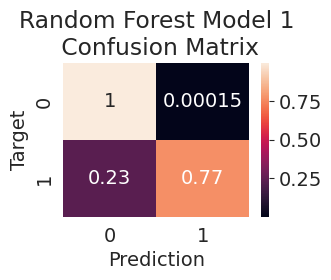

In [ ]:
val_preds, val_cf = predict_and_plot(model_RFClassifier1, X_val, y_val, 'Random Forest Model 1')

Accuracy: 99.60786%


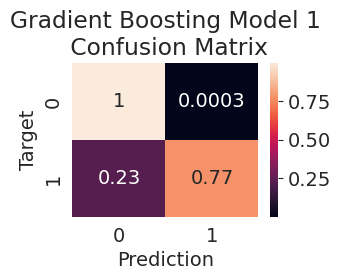

In [ ]:
val_preds, val_cf = predict_and_plot(model_GBClassifier1, X_val, y_val, 'Gradient Boosting Model 1')

Up to this point, it seems that Random Forest performs a little better than Gradient Boosting. Let's check the importance that each model assigned to each feature.

### Feature Importance

In [ ]:
importance_RFClassifier1_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model_RFClassifier1.feature_importances_.round(3)
}).sort_values('importance', ascending=False)
importance_GBClassifier1_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model_GBClassifier1.feature_importances_.round(3)
}).sort_values('importance', ascending=False)

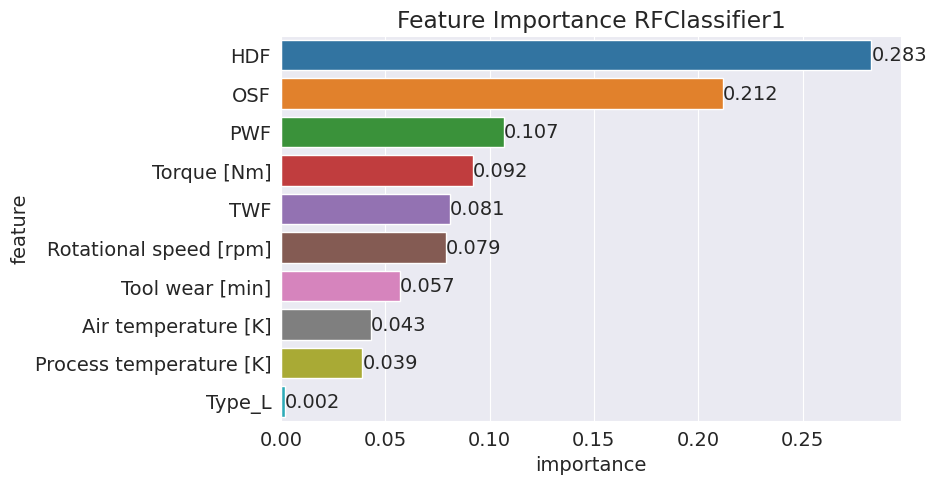

In [ ]:
ax = sns.barplot(data=importance_RFClassifier1_df.head(10), x='importance', y='feature');
ax.set(title='Feature Importance RFClassifier1');
ax.bar_label(ax.containers[0]);

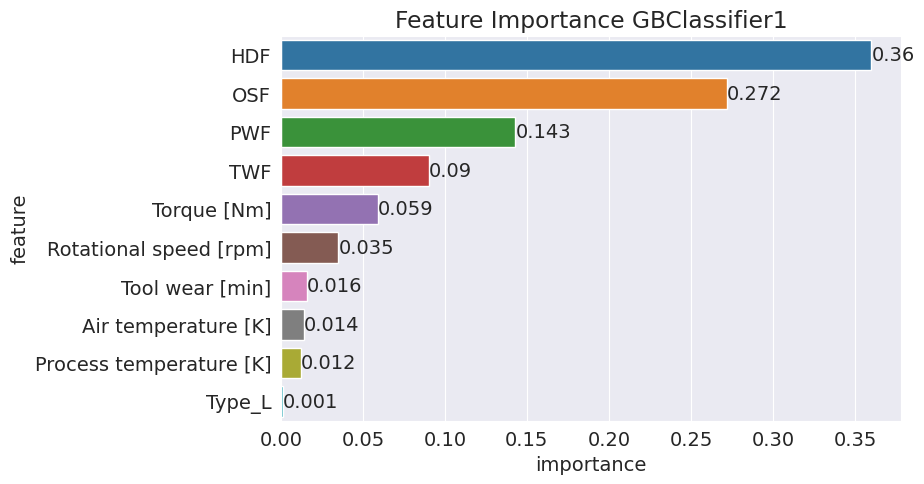

In [ ]:
ax = sns.barplot(data=importance_GBClassifier1_df.head(10), x='importance', y='feature');
ax.set(title='Feature Importance GBClassifier1');
ax.bar_label(ax.containers[0]);

GB puts more importance in `HDF` whereas RF is a *little* more balanced in the importance of its features. The drawback of gradient boosting method that does not scale as good on datasets with a large number of samples [5]. Thus, we will need to choose another kind of model if we expect to use to automatic featuring search.

## Hyperparamaters Tuning
Tuning hyperparameters is an important step when training model, there several hyperparameters for each type of model. Training them effectively and efficiently is the task of the data sciencetist. We currently are training two types of models: `DecisionTreeClassifier` and
According to Jobot the most important hyperparameters to tune when training a `DecisionTreeClassifier` are:

1. max_depth: The maximum depth of the tree.

2. min_samples_split: The minimum number of samples required to split an internal node.

3. n_estimators: The number of decision trees in the random forest.

Likewise, and according to Jobot, the most important hyperparameters to tune when training a `GradientBoostingClassifier` are:

1.   n_estimators: The number of boosting stages to perform.

2. learning_rate: This parameter controls the contribution of each weak learner to the final model. A lower learning rate makes the model learn slowly, but can lead to better generalization.

3. max_depth: The maximum depth of the weak learners (decision trees). Similar to max_depth in DecisionTreeClassifier, this parameter controls the complexity of the weak learners.

Just notice, every problem is different and choosing which hyperparameters as well as their optimal values depend on the specific dataset and problem you are working on.




First, let's write a helper function that will help us tune the hyperparameters.

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=2, random_state=42)

### RFClassifier Hyperparameters

First, we need to define de search space.

In [ ]:
space = dict()
space['max_depth'] = [10, 30, 50, 80, 100]
space['min_samples_split'] = [2, 5, 10]
space['n_estimators'] = [100, 300, 600]

Then, we need to define de search, for this case we will use `RandomizedSearchCV`class to perform a grid search [3].

In [ ]:
search = RandomizedSearchCV(model_RFClassifier1, space, scoring='accuracy', n_jobs=-1, cv=cv, random_state=42)

In [ ]:
%%time
result = search.fit(X_train, y_train)

CPU times: user 38.1 s, sys: 3.42 s, total: 41.5 s
Wall time: 1h 40min 31s


In [ ]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.9961701650961908
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 10}


Searching for the best hyperparameters with RF is slow, our space search is small, and even so, the time it took on google colab to complete was **1h 40min 31s**.

### HistGradientBoostingClassifier and Hyperparameters


Unfortunately, Grandient Botting's training do no scale up well with large datasets performing an hyperparameters' search will be a long process even for the `RandomizedSearchCV`. Hence, we'll try an alternative and different and relativately new to `sklearn`
Likewise, first, we need to define de search space.

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
model_HGBTClassifier = HistGradientBoostingClassifier(random_state=42)

In [ ]:
space = dict()
space['max_depth'] = [50, 100, 150, 300, 500]
space['learning_rate'] = [0.05, 0.1, 0.2]
space['max_iter'] = [25, 50, 100, 500, 900]
space['min_samples_leaf'] = [5, 10, 60, 120, 200]
space['max_leaf_nodes'] = [20, 30, 45, 75, 100]

In [ ]:
search = RandomizedSearchCV(model_HGBTClassifier, space, scoring='accuracy', n_jobs=-1, cv=cv, random_state=42)

In [ ]:
%%time
result = search.fit(X_train, y_train)

CPU times: user 6.18 s, sys: 478 ms, total: 6.66 s
Wall time: 3min 4s


In [ ]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.9961197719462644
Best Hyperparameters: {'min_samples_leaf': 10, 'max_leaf_nodes': 100, 'max_iter': 900, 'max_depth': 50, 'learning_rate': 0.05}


Even though we are setting up a bigger space search than the one used to train the Random Forest Classifier, **the Histogram Gradient Boosting Classifer's train time is many times lesser**.


> HGBT almost always offers a more favorable speed-accuracy trade-off than RF. [5]





## Training the Best Model

Eventhough both mobel achieve almost the same accurary score, HGBT is faster.

In [ ]:
params = {'min_samples_leaf': 10, 'max_leaf_nodes': 100, 'max_iter': 900, 'max_depth': 50, 'learning_rate': 0.05}

In [ ]:
best_model = HistGradientBoostingClassifier(random_state=42, **params)

In [ ]:
%%time
best_model.fit(X_train, y_train)

CPU times: user 5.04 s, sys: 41.4 ms, total: 5.09 s
Wall time: 3.32 s


HistGradientBoostingClassifier(learning_rate=0.05, max_depth=50, max_iter=900,
                               max_leaf_nodes=100, min_samples_leaf=10,
                               random_state=42)

Accuracy: 99.60419%


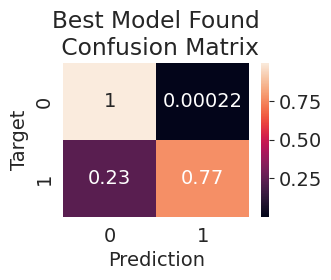

In [ ]:
val_preds, val_cf = predict_and_plot(best_model, X_val, y_val, 'Best Model Found')

## Putting it All Together with Pipelines
A pipeline is useful tool which can help us to easily apply the same preprocessing steps to both the training and testing datasets. By asking to Jobot [4] about pipelines:

> In machine learning, a pipeline is a concept that allows you to chain together multiple steps into a single unit. A typical machine learning pipeline consists of three main components:
1.   Data Preprocessing: This step involves transforming and preparing the data before feeding it into the model. It may include tasks such as feature scaling, handling missing values, encoding categorical variables, or creating new features.
2.   Feature Extraction/Selection: In this step, you can select relevant features from the dataset or perform feature extraction to reduce the dimensionality of the data. This helps to improve model performance and reduce computation time.
3. Model Training and Evaluation: This step involves selecting a machine learning algorithm, training it on the preprocessed data, and evaluating its performance using appropriate metrics (e.g., accuracy, precision, recall, etc.).

The library `sklearn` provides a `Pipeline` class that help us to achieve the aforementioned.







In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [ ]:
numeric_steps = [('scale', MinMaxScaler()) ]
pipe_num = Pipeline(numeric_steps)
pipe_num

Pipeline(steps=[('scale', MinMaxScaler())])

In [ ]:
categorical_steps = [('OHE', OneHotEncoder(drop='first',
                                   handle_unknown='ignore'))]
pipe_cat = Pipeline(categorical_steps)
pipe_cat

Pipeline(steps=[('OHE', OneHotEncoder(drop='first', handle_unknown='ignore'))])

We need to compose our two pipeline in order to make them work together as one. We'll use `ColumnTransformer`.

In [ ]:
preprocessing = ColumnTransformer(transformers=[
          ('numbers', pipe_num, numeric_cols),
          ('categories', pipe_cat, categorical_cols) ] )
preprocessing

ColumnTransformer(transformers=[('numbers',
                                 Pipeline(steps=[('scale', MinMaxScaler())]),
                                 ['Air temperature [K]',
                                  'Process temperature [K]',
                                  'Rotational speed [rpm]', 'Torque [Nm]',
                                  'Tool wear [min]', 'TWF', 'HDF', 'PWF', 'OSF',
                                  'RNF']),
                                ('categories',
                                 Pipeline(steps=[('OHE',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'))]),
                                 ['Type'])])

In [ ]:
model_pipeline = Pipeline([
    ('preprocess', preprocessing),
     ('model', best_model) ])
model_pipeline

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('numbers',
                                                  Pipeline(steps=[('scale',
                                                                   MinMaxScaler())]),
                                                  ['Air temperature [K]',
                                                   'Process temperature [K]',
                                                   'Rotational speed [rpm]',
                                                   'Torque [Nm]',
                                                   'Tool wear [min]', 'TWF',
                                                   'HDF', 'PWF', 'OSF',
                                                   'RNF']),
                                                 ('categories',
                                                  Pipeline(steps=[('OHE',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['Type'])])),
                ('model',
                 HistGradientBoostingClassifier(learning_rate=0.05,
                                                max_depth=50, max_iter=900,
                                                max_leaf_nodes=100,
                                                min_samples_leaf=10,
                                                random_state=42))])

Now, we can see that we have a pipeline that, first, it will discriminate between numeric and categorical features. Then, it will scale the numeric ones and encode the categorical. Finally, it will pass then to our model.

In [ ]:
%%time
model_pipeline.fit(train_df[input_cols], train_df[target_col])

CPU times: user 8.95 s, sys: 75.4 ms, total: 9.03 s
Wall time: 6.64 s


Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('numbers',
                                                  Pipeline(steps=[('scale',
                                                                   MinMaxScaler())]),
                                                  ['Air temperature [K]',
                                                   'Process temperature [K]',
                                                   'Rotational speed [rpm]',
                                                   'Torque [Nm]',
                                                   'Tool wear [min]', 'TWF',
                                                   'HDF', 'PWF', 'OSF',
                                                   'RNF']),
                                                 ('categories',
                                                  Pipeline(steps=[('OHE',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  ['Type'])])),
                ('model',
                 HistGradientBoostingClassifier(learning_rate=0.05,
                                                max_depth=50, max_iter=900,
                                                max_leaf_nodes=100,
                                                min_samples_leaf=10,
                                                random_state=42))])

In [ ]:
model_pipeline.classes_

array([0, 1])

We have trained our model, let's make some predictions on the test dataset.

### Making Predictions on the Test Set and Submission

In [ ]:
test_df.head(3)

,id,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],TWF,HDF,PWF,OSF,RNF
0,136429,L50896,L,302.3,311.5,1499,38.0,60,0,0,0,0,0
1,136430,L53866,L,301.7,311.0,1713,28.8,17,0,0,0,0,0
2,136431,L50498,L,301.3,310.4,1525,37.7,96,0,0,0,0,0


In [ ]:
preds = model_pipeline.predict(test_df[input_cols])
preds

array([0, 0, 0, ..., 0, 0, 0])

We need an specific format to make a submission. We need to create a csv file where the first column is the id of the machine and the second one is the probability of failure of such machine.

In [ ]:
preds_proba = model_pipeline.predict_proba(test_df[input_cols])
preds_proba

array([[9.98775831e-01, 1.22416879e-03],
       [9.98910031e-01, 1.08996869e-03],
       [9.99591992e-01, 4.08007561e-04],
       ...,
       [9.99587527e-01, 4.12472623e-04],
       [9.99647330e-01, 3.52670399e-04],
       [9.99145000e-01, 8.54999828e-04]])

The first element is the probability of non-failure. We only need the failure probability (second one).

In [ ]:
failure_proba = preds_proba[:, 1]

In [ ]:
submission_df = pd.DataFrame({
    'id': test_df['id'],
    'Machine failure': failure_proba
})
submission_df

,id,Machine failure
0,136429,0.001224
1,136430,0.001090
2,136431,0.000408
3,136432,0.000773
4,136433,0.000833
...,...,...
90949,227378,0.000849
90950,227379,0.000396
90951,227380,0.000412
90952,227381,0.000353


In [ ]:
submission_df.to_csv('submission.csv', index=None)

By summiting of prediction in the competition we had score: **0.96917**.

### Conclusions and Futher Improvement Suggestions

Like we had seen training a model is not a linear process and often requires more than one iteration. It is important to remark that not all the iterations of our process will give better results. What it is truly important is to use the gathered insights of each iteration to improve our models' performance. Below is a list of possible improvements based on the insights we had reckon up to now:

1. Some our our columns do follow a normal distribution (gaussian) and other not. So, adding another step to our pipeline to distinguish between them to dedice which scaler use. Basically:
>     If Data Is Gaussian:
>         Use StandarScaler
>     Else:
>         Use MinMaxScaler

2. Our dataset is pretty imbalances (notice Product ID in EDA). Therefore, trying to some technique to deal with that issue, e. g. SMOTE [6], might help to reduce the bias and make better predictions.

## References



1. [Binary Classification of Machine Failures Competition](https://www.kaggle.com/competitions/playground-series-s3e17/overview)
2. [Machine Failure Predictions](https://www.kaggle.com/datasets/dineshmanikanta/machine-failure-predictions)
3. [Hyperparameter Optimization With Random Search and Grid Search](https://machinelearningmastery.com/hyperparameter-optimization-with-random-search-and-grid-search/)
4. [Jobot - Powered by ChatGPT](https://jovian.com/jobot)
5. [Comparing Random Forests and Histogram Gradient Boosting models](https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_hist_grad_boosting_comparison.html#sphx-glr-auto-examples-ensemble-plot-forest-hist-grad-boosting-comparison-py)
6.[SMOTE for Imbalanced Classification with Python](https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/)


